#**Green Avenger Tree Detection Model**

###**Overview**

The task of accurately identifying and analyzing trees in aerial imagery presents challenges, especially when dealing with the dense and diverse ecosystems of tropical forests. The high variability in tree appearance due to the diverse species in tropical forests demands sophisticated algorithms capable of recognizing and generalizing different crown shapes. Integration of various types of geospatial data must be aligned for precise tree height measurement and species identification. Furthermore, the lack of labeled data for training machine learning models poses a significant barrier, especially in remote or inaccessible areas where field data collection is challenging. These complexities necessitate the development of advanced, reliable machine learning tools to improve the accuracy and efficiency of remote sensing applications in tropical forestry.

This project focuses on developing a robust model to identify and analyze trees in aerial images, specifically aimed at addressing ecological needs in dense tropical forests. The model has three primary objectives:

1. **Locate Trees in Aerial Images**: Utilize state-of-the-art machine learning techniques to detect tree presences in aerial imagery [1].

2. **Individual or Multiple Tree Detection**: Verify whether identified tree areas contain single or multiple tree crowns, serving as an evaluation metric for the first task.

3. **Tree Type Identification**: Identify palm trees and other types of trees, as palm trees are significant due to their economic and ecological importance.

###**Data**

The project utilizes high-resolution aerial imagery, Digital Surface Models (DSM), Digital Elevation Models (DEM), and RGB orthophotos, taken in Northern Rio Negro and Inhaa-Be areas by GainForest [2], to detect and analyze tree types in dense Amazonian tropical forests. Each individual drone flight includes a 2D processed Orthomosaic and a processed LiDAR height map for each respective flight. Training datasets for palm tree identification are labeled and added descriptions by ourselves, enhancing model robustness and generalization across diverse environments.

###**Suggested Application**

1.	Automates the detection of tree locations in large aerial images, facilitates forest cover mapping, deforestation monitoring, and environmental conservation planning.
2.	Provides insights into tree density and tree species for ecological assessments and management.

[1] https://github.com/PatBall1/detectree2

[2] https://gainforest.earth/

###**Load packages**

In [ ]:
%pip install git+https://github.com/PatBall1/detectree2.git
!pip install rasterio
!pip install laspy
!pip install geopandas matplotlib

from detectree2.preprocessing.tiling import tile_data
from detectree2.models.outputs import project_to_geojson, stitch_crowns, clean_crowns
from detectree2.models.predict import predict_on_data
#from detectree2.models.train import setup_cfg
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    DatasetMapper,
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.engine import DefaultTrainer
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import COCOEvaluator, verify_results
from detectron2.evaluation.coco_evaluation import instances_to_coco_json
from detectron2.structures import BoxMode
from detectron2.utils.events import get_event_storage  # noqa:F401
from detectron2.utils.events import EventStorage
from detectron2.utils.logger import log_every_n_seconds
from detectron2.utils.visualizer import ColorMode, Visualizer
import detectron2.data.transforms as T  # noqa:N812
from detectron2 import model_zoo
from detectron2.checkpoint import DetectionCheckpointer  # noqa:F401
import detectron2.utils.comm as comm

import datetime
import glob
import json
import logging
import os
import random
import time
from pathlib import Path
from typing import Any, Dict, List
import cv2
import numpy as np
import torch
import shutil
import subprocess
from typing import Optional

import rasterio
from rasterio.vrt import WarpedVRT
from rasterio.enums import Resampling
from rasterio.windows import from_bounds
from rasterio.plot import show
from rasterio.features import rasterize
from rasterio.mask import mask

import geopandas as gpd
import matplotlib.pyplot as plt
import gdown
import laspy
from shapely.geometry import mapping
from shapely.geometry import box
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.stats import gaussian_kde

import matplotlib.patches as mpatches

  Cloning https://github.com/PatBall1/detectree2.git to /tmp/pip-req-build-8whgyqa2
  Running command git clone --filter=blob:none --quiet https://github.com/PatBall1/detectree2.git /tmp/pip-req-build-8whgyqa2
  Resolved https://github.com/PatBall1/detectree2.git to commit 2f29886bafcb63743a7f3ab596c5c3796ca4a243
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-install-obccrs28/detectron2_b91769f74162457a97dfa6e9b9f721d9
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-install-obccrs28/detectron2_b91769f74162457a97dfa6e9b9f721d9
  Resolved https://github.com/facebookresearch/detectron2.git to commit 0df2d73d0013db7de629602c23cc120219b4f2b8
  Preparing metadata (setup.py) ... done


/usr/local/lib/python3.10/dist-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.3-CAPI-1.17.3) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


###**Objective 1: Model for Predicted Canopy Polygons**
The model processes raw aerial imagery, applies the detection model, and outputs the locations of detected trees as vector data in the *GeoPackage* file, which can be easily used for further ecological analysis or integration with GIS applications.

**Convert an input image to projected coordinates and optionally resample**

The function can operate on various tiling resolutions (measured in meters per pixel), allowing to optimize the balance between detail capture and processing efficiency. Higher resolutions can delineate individual trees more effectively, whereas lower resolutions are beneficial for broader landscape analysis.

In [ ]:
def scale_transform(vrt, target_gsd_m):
    """
    Calculate scale factor and destination transform for a raster based on target ground sample distance.

    Args:
    vrt (rasterio.vrt.WarpedVRT): The virtual raster to scale.
    target_gsd_m (float): The target ground sample distance in meters.

    Returns:
    tuple: scale factor and the new affine transformation.
    """
    scale_x = target_gsd_m / vrt.res[0]
    scale_y = target_gsd_m / vrt.res[1]
    scale = (scale_x + scale_y) / 2

    new_transform = vrt.transform * vrt.transform.scale(
        (vrt.width / scale) / vrt.width,
        (vrt.height / scale) / vrt.height
    )

    return scale, new_transform

def convert_to_projected(
    path: str,
    output_path: str = None,
    temp_name: Optional[str] = None,
    inplace: Optional[bool] = False,
    resample: Optional[bool] = False,
    target_gsd_m: float = 0.1,
    dst_crs: str = "EPSG:3395",
    use_vrt: bool = True,
) -> None:
    """Convert an input image to projected coordinates and optionally resample

    Args:
        path (str): Path to image (typically a GeoTiff)
        output_path (str, optional): Path to the new stored image
        temp_name (str, optional): Optional temporary filename when processing. Defaults to None.
        inplace (bool, optional): Process input file in place - will overwrite your image! Defaults to False.
        resample (bool, optional): Resample the input image. Defaults to False.
        target_gsd_m (float): Target ground sample distance in metres. Defaults to 0.1.
        use_vrt (bool): Use WarpedVRT instead of GDAL directly, should masking but may be slower

    """

    if use_vrt:
        with rasterio.Env(GDAL_NUM_THREADS="ALL_CPUS", GDAL_TIFF_INTERNAL_MASK=True):
            with rasterio.open(path) as src:
                with WarpedVRT(
                    src,
                    crs=dst_crs,
                    resampling=Resampling.bilinear,
                    warp_mem_limit=256,
                    warp_extras={"NUM_THREADS": "ALL_CPUS"},
                ) as vrt:
                    scale, dst_transform = scale_transform(vrt, target_gsd_m)

                    height = int(round(vrt.height * scale))
                    width = int(round(vrt.width * scale))

                    dst_window = from_bounds(*src.bounds, src.transform)
                    data = vrt.read(
                        window=dst_window, out_shape=(src.count, width, height)
                    )

                profile = src.profile.copy()
                profile.update(
                    {
                        "count": 3,
                        "crs": dst_crs,
                        "transform": dst_transform,
                        "width": width,
                        "height": height,
                        "nodata": 0,
                        "dtype": "uint8",
                        "driver": "GTiff",
                        "compress": "JPEG",
                        "tiled": True,
                        "blockxsize": 512,
                        "blockysize": 512,
                    }
                )

                if output_path is None:
                    base, ext = os.path.splitext(path)
                    output_path = base + f"_proj_{int(target_gsd_m*100)}" + ext

                with rasterio.open(output_path, "w", **profile) as dst:
                    dst.write(data[:3])

                if inplace:
                    shutil.move(output_path, path)

        return

    with rasterio.open(path) as img:
        working_dir = os.path.dirname(path)
        filename, ext = os.path.splitext(os.path.basename(path))

        if temp_name is None:
            temp_name = "_" + filename

        temporary_vrt = os.path.join(working_dir, f"{temp_name}_m.vrt")

        # Convert to a VRT for speed
        logger.info(f"Converting {temp_name} to projected CRS")
        pargs = [
            "gdalwarp",
            "-multi",
            "-wo",
            "NUM_THREADS=ALL_CPUS",
            "-co",
            "TILED=YES",
            "-co",
            "BLOCKXSIZE=512",
            "-co",
            "BLOCKYSIZE=512",
            "-co",
            "COMPRESS=NONE",
            "-co",
            "SRC_METHOD=NO_GEOTRANSFORM",
            "-r",
            "lanczos",
            "-t_srs",
            dst_crs,
            "-ot",
            "Byte",
            "-overwrite",
            "-of",
            "vrt",
            f"{path}",
            temporary_vrt,
        ]

        try:
            subprocess.check_output(pargs)
        except subprocess.CalledProcessError as error:
            logger.error(error.output)

        temporary_tif = os.path.join(working_dir, f"{temp_name}_m.tif")

        # Then compress
        logger.info(f"Compressing {temp_name}")
        pargs = [
            "gdal_translate",
            "-co",
            "NUM_THREADS=ALL_CPUS",
            "-co",
            "BIGTIFF=IF_SAFER",
            "-co",
            f"COMPRESS=JPEG",
            "-co",
            "TILED=YES",
            "-co",
            "BLOCKXSIZE=512",
            "-co",
            "BLOCKYSIZE=512",
            "-r",
            "lanzcos",
        ]

        if img.count != 1:
            pargs.extend(["-co", "PHOTOMETRIC=YCBCR"])

        if img.count > 3:
            pargs.extend(["-b", "1", "-b", "2", "-b", "3", "-mask", "4"])

        pargs.append(temporary_vrt)
        pargs.append(temporary_tif)

        try:
            subprocess.check_output(pargs)
        except subprocess.CalledProcessError as error:
            logger.error(error.output)

        if inplace:
            shutil.move(temporary_tif, path)
            os.remove(temporary_vrt)
            new_path = path
        else:
            new_path = os.path.join(working_dir, f"{filename}_proj{ext}")
            shutil.move(temporary_tif, new_path)
            os.remove(temporary_vrt)

    if resample:
        args = [
            "gdalwarp",
            "-multi",
            "-wo",
            "NUM_THREADS=ALL_CPUS",
            "-co",
            "BIGTIFF=IF_SAFER",
            "-co",
            f"COMPRESS=JPEG",
            "-co",
            "TILED=YES",
            "-co",
            "BLOCKXSIZE=512",
            "-co",
            "BLOCKYSIZE=512",
            "-r",
            "lanczos",
            "-t_srs",
            dst_crs,
            "-tr",
            f"{target_gsd_m}",
            f"{target_gsd_m}",
            "-overwrite",
        ]

        if inplace:
            args.append("-overwrite")

        base, ext = os.path.splitext(new_path)

        if output_path is None:
            output_path = base + f"_{int(target_gsd_m*100)}" + ext

        args.extend([new_path, output_path])

        logger.info("Running {}".format(" ".join(args)))
        res = subprocess.check_output(args)

        if inplace:
            shutil.move(output_path, path)


**Conversion from original image to targeted resolution (pixel to m/pixel)**

Scale Factor and Tile Size Calculation

When working with image data, we often need to adjust the image resolution. This is achieved by calculating a scale factor, which is the ratio of the native resolution to the target resolution and is used to determine the size of the tiles necessary to achieve the desired resolution in the output image.

**Formula to Calculate the Scale Factor:**

The scale factor is calculated as:
$$
\text{Scale Factor} = \frac{\text{Native Resolution}}{\text{Target Resolution}}
$$
For example, if the native resolution is 0.05 meters/pixel and the target resolution is 0.1 meters/pixel, the scale factor would be:
$$
\text{Scale Factor} = \frac{0.05}{0.1} = 0.5
$$

**Determining the Original Tile Size:**

To achieve a specific tile size after rescaling, compute the original tile size as:
$$
\text{Original Tile Size} = \text{Target Tile Size} \times \left(\frac{1}{\text{Scale Factor}}\right)
$$
Thus, to get a tile of size 1024x1024 pixels at the target resolution, we need to sample:
$$
1024 \times \left(\frac{1}{0.5}\right) = 2048 \times 2048
$$
pixels from the original image at native resolution.



In [ ]:
convert_to_projected(path="rgb.tif", output_path="projected.tif", target_gsd_m=0.05)

The function is design to segment the larger raster image into smaller, manageable tiles of specified dimensions.





In [ ]:
img_path = "projected.tif"
data = rasterio.open(img_path)
tiles_path = "/tilespred/"

# Tiling parameters
buffer = 30
tile_width = 40
tile_height = 40

# Function to tile the data
tile_data(data, tiles_path, buffer, tile_width, tile_height, dtype_bool=True)

Tiling to 304 total tiles
Processed 150 tiles of 304 tiles
Tiling complete


The *setup_cfg* function is modified from *detectree2* in order to generate the output which has standardized 1024x1024 pixels prediction resolution, ensuring each output tile captures a sufficient area with high detail, enabling accurate tree crown predictions while maintaining manageable file sizes for processing and analysis.

In [ ]:
def setup_cfg(
    base_model: str = "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml",
    trains=("trees_train", ),
    tests=("trees_val", ),
    update_model=None,
    workers=2,
    ims_per_batch=2,
    gamma=0.1,
    backbone_freeze=3,
    warm_iter=120,
    momentum=0.9,
    batch_size_per_im=1024,
    base_lr=0.0003389,
    weight_decay=0.001,
    max_iter=1000,
    num_classes=1,
    eval_period=100,
    out_dir="./train_outputs",
    resize=True
):
    """
    Set up config object # noqa: D417.

    Args:
        base_model: base pre-trained model from detectron2 model_zoo
        trains: names of registered data to use for training
        tests: names of registered data to use for evaluating models
        update_model: updated pre-trained model from detectree2 model_garden
        workers: number of workers for dataloader
        ims_per_batch: number of images per batch
        gamma: gamma for learning rate scheduler
        backbone_freeze: backbone layer to freeze
        warm_iter: number of iterations for warmup
        momentum: momentum for optimizer
        batch_size_per_im: batch size per image
        base_lr: base learning rate
        weight_decay: weight decay for optimizer
        max_iter: maximum number of iterations
        num_classes: number of classes
        eval_period: number of iterations between evaluations
        out_dir: directory to save outputs
    """
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file(base_model))
    cfg.DATASETS.TRAIN = trains
    cfg.DATASETS.TEST = tests
    cfg.DATALOADER.NUM_WORKERS = workers
    cfg.SOLVER.IMS_PER_BATCH = ims_per_batch
    cfg.SOLVER.GAMMA = gamma
    cfg.MODEL.BACKBONE.FREEZE_AT = backbone_freeze
    #cfg.MODEL.DEVICE = 'cpu'
    cfg.SOLVER.WARMUP_ITERS = warm_iter
    cfg.SOLVER.MOMENTUM = momentum
    cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = batch_size_per_im
    cfg.SOLVER.WEIGHT_DECAY = weight_decay
    cfg.SOLVER.BASE_LR = base_lr
    cfg.OUTPUT_DIR = out_dir
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    if update_model is not None:
        cfg.MODEL.WEIGHTS = update_model
    else:
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(base_model)

    cfg.SOLVER.IMS_PER_BATCH = ims_per_batch
    cfg.SOLVER.BASE_LR = base_lr
    cfg.SOLVER.MAX_ITER = max_iter
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes
    cfg.TEST.EVAL_PERIOD = eval_period
    cfg.RESIZE = resize
    cfg.INPUT.MIN_SIZE_TRAIN = 1000
    cfg.INPUT.MAX_SIZE_TRAIN = 1024
    return cfg

Download the pre-trained model for canopy prediction from *Detectron2* (https://github.com/facebookresearch/detectron2)

In [ ]:
!wget https://zenodo.org/records/10522461/files/230103_randresize_full.pth

--2024-06-02 13:15:21--  https://zenodo.org/records/10522461/files/230103_randresize_full.pth
Resolving zenodo.org (zenodo.org)... 188.185.79.172, 188.184.98.238, 188.184.103.159, ...
Connecting to zenodo.org (zenodo.org)|188.185.79.172|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 498209001 (475M) [application/octet-stream]
Saving to: ‘230103_randresize_full.pth’

230103_randresize_f 100%[===================>] 475.13M  14.0MB/s    in 37s     

2024-06-02 13:15:59 (13.0 MB/s) - ‘230103_randresize_full.pth’ saved [498209001/498209001]



Predict tree canopy polygons aiming for individual trees and generate gpkg file


In [ ]:
trained_model = "./230103_randresize_full.pth"
cfg = setup_cfg(update_model=trained_model)

# implement prediction using the pretrained model
predict_on_data(tiles_path, predictor=DefaultPredictor(cfg))
project_to_geojson(tiles_path, tiles_path + "predictions/", tiles_path + "predictions_geo/")
crowns = stitch_crowns(tiles_path + "predictions_geo/", 1)

# set a confidence > 0 to filter out less confident crowns
clean = clean_crowns(crowns, 0.3, confidence=0)
# filter confidence score lower than 0.3
clean = clean[clean["Confidence_score"] > 0.3]
# set proximity to 0.3
clean = clean.set_geometry(clean.simplify(0.3))
clean.to_file("crowns_out.gpkg")

Predicting 33 files


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.10/dist-packages/detectron2/layers/wrappers.py:142: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  x = F.conv2d(


Projecting 33 files
Cleaning 2429 crowns
0 / 2429 crowns cleaned
1000 / 2429 crowns cleaned
2000 / 2429 crowns cleaned


Visualize individual crown polygons

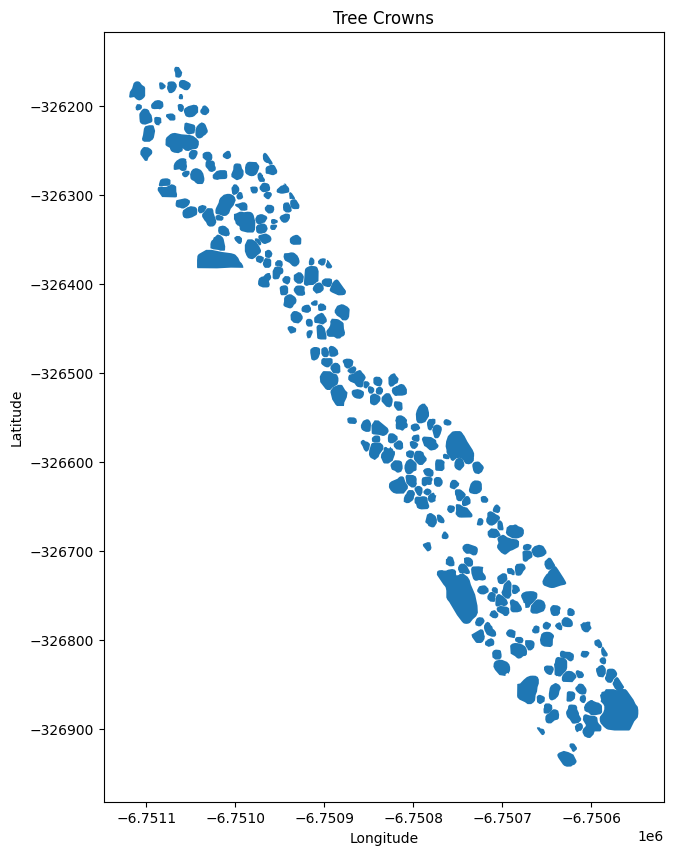

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
clean.plot(ax=ax)

ax.set_title('Tree Crowns')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

Visualize individual crown shapes overlapped with the rgb file

/usr/local/lib/python3.10/dist-packages/rasterio/plot.py:109: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


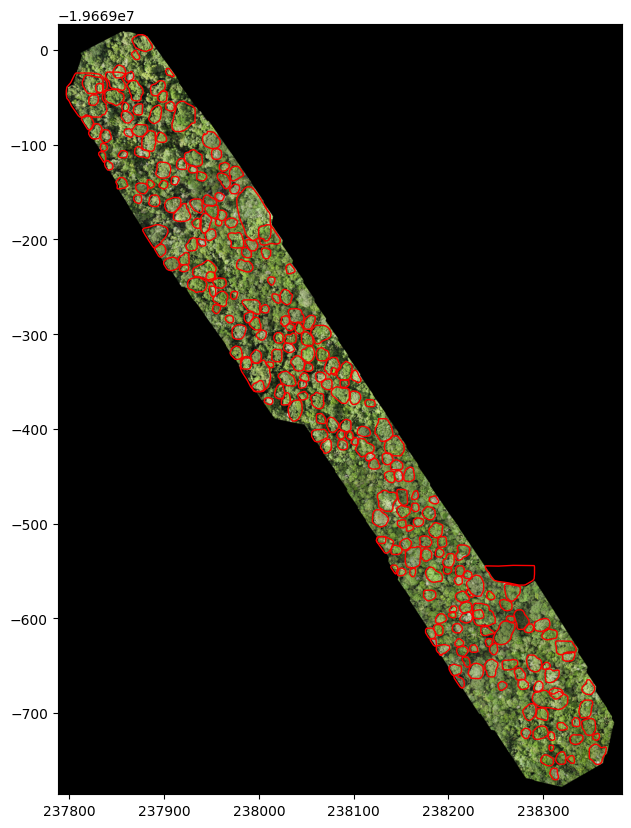

In [ ]:
tree_crowns = gpd.read_file('crowns_out.gpkg')
raster_path = "rgb.tif"
sat_image = rasterio.open(raster_path)
tree_crowns = tree_crowns.to_crs(sat_image.crs)
fig, ax = plt.subplots(figsize=(10, 10))
show(sat_image, ax=ax)
# Overlay the tree crowns
tree_crowns.plot(ax=ax, facecolor='none', edgecolor='red')
plt.show()

###**Objective 2: Individual or Multiple Tree Detection**

The second objective of our model is to verify whether identified tree polygons contain single or multiple tree crowns. Given the fully automated nature of eventual goal of tree detection system, manual labeling of individual tree crowns within complex aerial images is impractical. To address this, we employ a statistical approach within each detected polygon to determine whether it contains a single tree or multiple trees. This method is crucial for serving as an important evaluation metric for the accuracy and reliability of the tree detection capabilities established in the first objective.

The model utilizes high-resolution DSM, DEM, and RGB orthophotos, aligns and reprojects the data to a common coordinate reference system for spatially consistent purposes, and calculates the difference between DSM and DEM to derive tree heights for the actual height of tree canopies above the ground level. Tree height is a pivotal metric in forest ecology as it indicates the maturity and biomass of trees, and can also suggest the presence of different tree species. Variations in tree height within a single polygon can indicate the presence of multiple tree crowns:

1.	**Single Tree**: If the height data within a polygon is relatively uniform or shows a clear peak, it likely represents a single tree crown.

2.	**Multiple Trees**: If the height data shows multiple peaks or significant variation, this can suggest the presence of multiple tree crowns within the polygon. This is often the case in densely forested areas where tree canopies might overlap or be closely situated.


*An example of tree height distribution in a polygon*

DSM CRS: EPSG:32650
Polygon CRS: EPSG:3395
Reprojected polygons CRS to match DSM: PROJCS["WGS 84 / UTM zone 50N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",117],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32650"]]


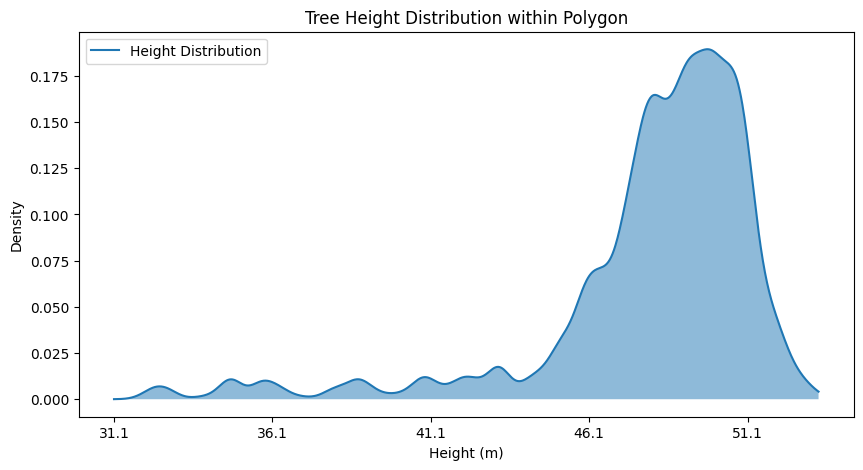

In [ ]:
with rasterio.open('dsm.tif') as src_dsm, rasterio.open('dem.tif') as src_dem:
    dsm = src_dsm.read(1)
    dsm_transform = src_dsm.transform
    dsm_crs = src_dsm.crs
    dem_resampled = src_dem.read(
        1,
        out_shape=(src_dsm.height, src_dsm.width),
        resampling=Resampling.bilinear
    )
    transform = src_dem.transform * src_dem.transform.scale(
        (src_dem.width / src_dsm.width),
        (src_dem.height / src_dsm.height)
    )

    tree_heights = dsm - dem_resampled

    polygons = gpd.read_file('crowns_out.gpkg')
    print("DSM CRS:", src_dsm.crs)
    print("Polygon CRS:", polygons.crs)

    if src_dsm.crs != polygons.crs:
      polygons = polygons.to_crs(src_dsm.crs)
    print("Reprojected polygons CRS to match DSM:", polygons.crs)

    #Change individual polygon here
    polygon_geom = polygons.geometry[40]

    out_image, out_transform = mask(src_dsm, [polygon_geom], crop=True)
    masked_heights = out_image[0]

    masked_heights = np.where(masked_heights == src_dsm.nodata, np.nan, masked_heights)

    data = masked_heights.flatten()
    data = data[~np.isnan(data)]

    density = gaussian_kde(data)
    x = np.linspace(min(data), max(data), 1000)
    y = density(x)

    plt.figure(figsize=(10, 5))
    plt.plot(x, y, label='Height Distribution')
    plt.fill_between(x, y, alpha=0.5)
    plt.title('Tree Height Distribution within Polygon')
    plt.xlabel('Height (m)')
    plt.ylabel('Density')
    plt.legend()

    plt.xticks(np.arange(min(x), max(x)+1, 5))

**Model of Tree Height Distributions**

The model identifies areas (defined by polygons) where the height distribution of trees is unimodal or Multimodal.

Some mathematical formulas involved in the algorithm:

1. **Calculating Tree Heights:**
   $$\text{Tree Heights} = \text{DSM} - \text{DEM}$$

2. **Statistical Analysis to Detect Multimodal Distributions:**
   - A Gaussian Kernel Density Estimate KDE is computed for the heights:
     $$
     f(x) = \frac{1}{n \times h} \sum_{i=1}^{n} K\left(\frac{x - x_i}{h}\right)
     $$
     where K is the kernel, h is the bandwidth, and n is the number of data points.
   - The distribution is scanned for local maxima (peaks), with a dynamic threshold applied to consider a peak significant:
     $$
     \text{Threshold} = \text{Max Density} \times \text{Threshold Factor}
     $$
     Here, threshold is set to 0.5, meaning a peak must reach at least half the maximum density to be considered.
   - Each peak is examined for its separation from the next significant peak. A dynamic minimum separation of 5 meters is set to confirm that the peaks represent distinct modes in the distribution:
       $$
       \text{Separation} \geq 5 \text{ meters}
       $$
3. **Determining Multimodality:**
   - If more than one significant peak is detected, the distribution is flagged as multimodal, otherwise it's unimodal.


In [ ]:
bimodal_flags = []

with rasterio.open('dsm.tif') as src_dsm, rasterio.open('dem.tif') as src_dem:
    dsm = src_dsm.read(1)
    dem_resampled = src_dem.read(
        1,
        out_shape=(src_dsm.height, src_dsm.width),
        resampling=Resampling.bilinear
    )

    tree_heights = dsm - dem_resampled

    polygons = gpd.read_file('crowns_out.gpkg')
    if src_dsm.crs != polygons.crs:
        polygons = polygons.to_crs(src_dsm.crs)

    for idx, polygon in polygons.iterrows():
        polygon_geom = polygon.geometry
        out_image, out_transform = mask(src_dsm, [polygon_geom], crop=True)
        masked_heights = out_image[0]
        masked_heights = np.where(masked_heights == src_dsm.nodata, np.nan, masked_heights)
        data = masked_heights.flatten()
        data = data[~np.isnan(data)]

        if data.size > 0:
            density = gaussian_kde(data)
            x = np.linspace(min(data), max(data), 1000)
            y = density(x)

            max_density = np.max(y)
            threshold_factor = 0.5
            dynamic_threshold = max_density * threshold_factor

            peaks = np.diff(np.sign(np.diff(y))).nonzero()[0] + 1
            filtered_peaks = []
            for peak in peaks:
                if y[peak] >= dynamic_threshold and (not filtered_peaks or x[peak] - x[filtered_peaks[-1]] >= 5):
                    filtered_peaks.append(peak)

            if len(filtered_peaks) > 1:
                bimodal_flags.append(1)  # Bimodal
            else:
                bimodal_flags.append(0)  # Not bimodal
        else:
          bimodal_flags.append(-1)

polygons['Multimodal'] = bimodal_flags
print(polygons[['Multimodal']])

     Multimodal
0             0
1             0
2             0
3             0
4             0
..          ...
248           0
249           0
250           0
251           1
252           0

[253 rows x 1 columns]


Visualize unimodal and multimodal on the rgb file

/usr/local/lib/python3.10/dist-packages/rasterio/plot.py:109: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


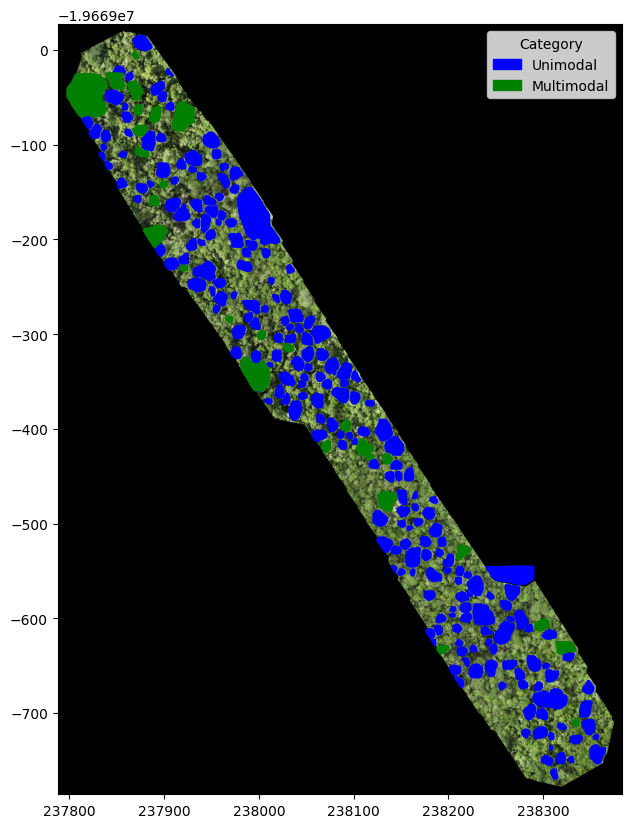

In [ ]:
raster_path = "rgb.tif"
sat_image = rasterio.open(raster_path)
polygons = polygons.to_crs(sat_image.crs)

colors = {0: 'blue', 1: 'green'}
fig, ax = plt.subplots(figsize=(10, 10))
show(sat_image, ax=ax)
for value, group in polygons.groupby('Multimodal'):
    color = colors[value]
    group.plot(ax=ax, color=color, label=f'{value} {"Unimodal" if value == 0 else "Multimodal"}')
handles = [mpatches.Patch(color=color, label=f'{"Unimodal" if idx == 0 else "Multimodal"}') for idx, color in colors.items()]
ax.legend(handles=handles, title='Category')

plt.show()

**Evaluation metric to the proposed model using Moran's I**:

**Moran's I** is a statistic used to measure spatial autocorrelation, defined as the correlation of a variable with itself through space.

**Calculation Steps for Moran's I**

1. Calculate the mean height, denoted as $ \bar{x} $.
2. Compute the deviation of each height from the mean.
3. Set up a spatial weight matrix based on the distances or connectivity (e.g., neighboring points have a weight of 1, non-neighbors have a weight of 0).
4. Apply Moran's I formula:
   $$
   I = \frac{n}{\sum_{i}\sum_{j}w_{ij}} \cdot \frac{\sum_{i}\sum_{j}w_{ij}(x_i - \bar{x})(x_j - \bar{x})}{\sum_{i}(x_i - \bar{x})^2}
   $$
   where n is the number of spatial units indexed by i and j, x is the attribute of interest (tree height), $ w_{ij} $ is the spatial weight between units i and j, and $\bar{x}$ is the mean of x.

**Interpreting the Results**

- **High Moran's I (close to +1.0)**: Suggests a single, cohesive tree crown or very closely situated trees.
- **Low Moran's I (close to -1.0)**: Indicates dispersed tree heights, suggesting multiple distinct trees.
- **Moran's I around zero**: Implies random distribution of tree heights, which could also indicate multiple trees without any spatial clustering.

In [ ]:
!pip install libpysal
!pip install esda
from libpysal.weights import Queen, lat2W
from esda.moran import Moran

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.4/132.4 kB 2.7 MB/s eta 0:00:00


DSM CRS: EPSG:32650
Polygon CRS: EPSG:3395
Reprojected polygons CRS to match DSM: PROJCS["WGS 84 / UTM zone 50N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",117],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32650"]]
      Moran_I
0    0.973459
1    0.946726
2    0.968478
3    0.990462
4    0.987637
..        ...
248  0.962758
249  0.981026
250  0.979752
251  0.972368
252  0.973592

[253 rows x 1 columns]


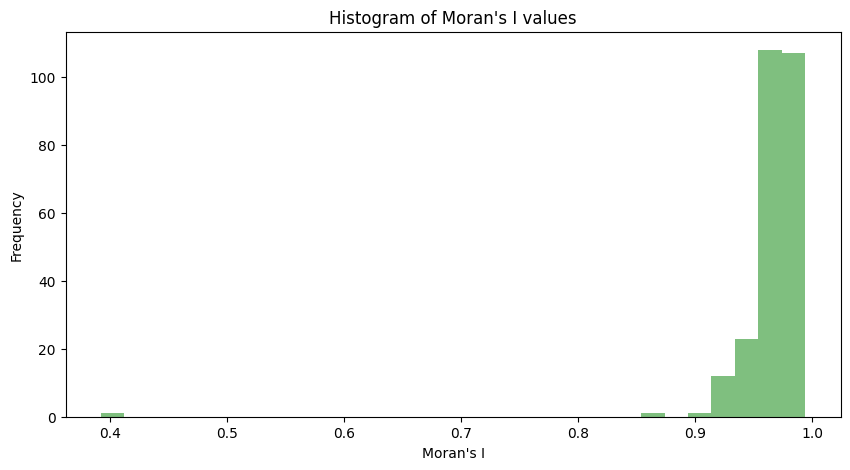

In [ ]:
with rasterio.open('dsm.tif') as src_dsm, rasterio.open('dem.tif') as src_dem:
    dsm = src_dsm.read(1)
    dsm_transform = src_dsm.transform
    dsm_crs = src_dsm.crs

    dem_resampled = src_dem.read(
        1,
        out_shape=(src_dsm.height, src_dsm.width),
        resampling=rasterio.enums.Resampling.bilinear
    )

    transform = src_dem.transform * src_dem.transform.scale(
        (src_dem.width / src_dsm.width),
        (src_dem.height / src_dsm.height)
    )

    tree_heights = dsm - dem_resampled

    polygons = gpd.read_file('crowns_out.gpkg')
    print("DSM CRS:", src_dsm.crs)
    print("Polygon CRS:", polygons.crs)

    if src_dsm.crs != polygons.crs:
        polygons = polygons.to_crs(src_dsm.crs)
    print("Reprojected polygons CRS to match DSM:", polygons.crs)

    bimodal_flags = []
    moran_i_values = []

    for idx, polygon in polygons.iterrows():
        polygon_geom = polygon.geometry
        out_image, out_transform = mask(src_dsm, [polygon_geom], crop=True)
        masked_heights = out_image[0]
        masked_heights = np.where(masked_heights == src_dsm.nodata, np.nan, masked_heights)

        if np.any(np.isnan(masked_heights)):
            masked_heights = np.nan_to_num(masked_heights, nan=np.nanmean(masked_heights))

        data = masked_heights.flatten()

        if data.size > 0 and masked_heights.size == (out_image.shape[1] * out_image.shape[2]):
            shape = masked_heights.shape
            w = lat2W(*shape)
            moran = Moran(masked_heights, w)
            moran_i_values.append(moran.I)
        else:
            moran_i_values.append(np.nan)

    polygons['Moran_I'] = moran_i_values

    print(polygons[['Moran_I']])

    plt.figure(figsize=(10, 5))
    plt.hist(moran_i_values, bins=30, color='green', alpha=0.5)
    plt.title('Histogram of Moran\'s I values')
    plt.xlabel('Moran\'s I')
    plt.ylabel('Frequency')
    plt.show()

**Interpretation of results:**

We set a dynamic threshold 0.9 to consider whether a Moran I value with corresponding polygon is unimodal or multimodal. If it is greater than 0.9, it is unimodal, and vice versa. We compare it with the previously proposed model and found the similiarity score of 0.87 in our testing image. We also tried to use RGB values as a metrics (shown in Appendix), it turns out the RGB metrics is not a valid way to verify it, as the RGB shows significantly small correlation with any individuals. Thus, because the Moran I model requires significantly run time and the similarity score is relatively high, we conclude the first model we proposed is a reasonable methodology to verify whether it is a single tree crown.

In [ ]:
polygons['Moran_I'] = moran_i_values
list_check = []
for i in range(0,len(moran_i_values)):
  if moran_i_values[i] >= 0.9:
    list_check.append(0)
  else:
    list_check.append(1)
sum = 0
for i in range(0,len(moran_i_values)):
  if (bimodal_flags[i] == list_check[i]):
    sum += 1
accuracy = sum/len(moran_i_values)
accuracy

0.8735177865612648

**Inference to objective 1**

As we verified such proposed evaluation metrics' validity, we calculate the percentage of single tree crowns among all the polygons. The result shows 88% of the polygons circled as individual tree which indicates the model from 'objective 1' is effective.

In [ ]:
uni_modal = bimodal_flags.count(0)
uni_ptg = uni_modal/len(bimodal_flags)
uni_ptg

0.8814229249011858

###**Objective 3: Model for Tree Type Identification**

The third objective of our project involves the application of advanced deep learning techniques to identify different tree types in satellite imagery, with a particular focus on palm trees due to their significant economic and ecological value. Palm trees are crucial for providing food, shelter, and other resources in tropical regions, including the Amazonian forest, where they play a vital role in the local ecosystem.

Extract Single Image from Individual Polygon

In [ ]:
tree_crowns_path = "crowns_out.gpkg"
raster_path = "rgb.tif"
tree_crowns = gpd.read_file(tree_crowns_path)
sat_image = rasterio.open(raster_path)
tree_crowns = tree_crowns.to_crs(sat_image.crs)
output_directory = "tree_images"
os.makedirs(output_directory, exist_ok=True)

def extract_trees(sat_image, tree_crowns, output_dir):
    for i, row in tree_crowns.iterrows():
        geom = row.geometry
        bbox = geom.bounds
        bbox_geom = box(*bbox)
        out_image, out_transform = mask(sat_image, [bbox_geom], crop=True)
        out_image = np.squeeze(out_image)
        out_meta = sat_image.meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })
        output_path = os.path.join(output_dir, f"tree_{i}.tif")
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)
extract_trees(sat_image, tree_crowns, output_directory)

/usr/local/lib/python3.10/dist-packages/rasterio/mask.py:191: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  out_image = dataset.read(
/usr/local/lib/python3.10/dist-packages/rasterio/mask.py:191: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  out_image = dataset.read(
/usr/local/lib/python3.10/dist-packages/rasterio/mask.py:191: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  out_image = dataset.read(
/usr/local/lib/python3.10/dist-packages/rasterio/mask.py:191: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  out_image = dataset.read(
/usr/local/lib/python3.10/dist-packages/rasterio/mask.py:191: NodataShadowWarning: The dataset's nodata 

Import Packages

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from sklearn.model_selection import train_test_split
import tensorflow as tf
from PIL import Image
import nltk
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC

**Training Dataset**

The training dataset includes both images and textual information. Each image in our training dataset is carefully labeled as either 'palm' or 'not palm' as well as their names labelled by ecologists with diverse descriptions we added according to their scientific names to enhance the dataset's variability and robustness. These descriptions include plant's growing environment, biological characteristics, and etc. This diverse annotation approach ensures that our model can generalize well across different environments and palm tree appearances in the Amazonian forest. In total, we have

The dataset can be downloaded from [HuggingFace](https://huggingface.co/datasets/greenavenger/Tree_detection/resolve/main/palm_images.zip?download=true) and imported to GoogleDrive for usage.

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


Model with only images



In [ ]:
base_path = '/content/drive/My Drive/palm_images'
subfolders = ['palm', 'non_palm']

images = []
labels = []

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = tf.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

for folder in subfolders:
    folder_path = os.path.join(base_path, folder)
    files = os.listdir(folder_path)
    for file in files:
        if file.endswith('.JPG'):
            img_path = os.path.join(folder_path, file)
            images.append(load_and_preprocess_image(img_path))
            labels.append(subfolders.index(folder))

images = tf.concat(images, axis=0)
labels = tf.convert_to_tensor(labels, dtype=tf.int64)

train_indices, test_indices = train_test_split(range(len(images)), test_size=0.2, random_state=42)
train_images = tf.gather(images, train_indices)
test_images = tf.gather(images, test_indices)
train_labels = tf.gather(labels, train_indices)
test_labels = tf.gather(labels, test_indices)

model_resnet = ResNet50(
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

train_embeddings = model_resnet.predict(train_images)
test_embeddings = model_resnet.predict(test_images)

1/1 [==============================] - 1s 1s/step


Accuracy: 0.90
Classification Report:
               precision    recall  f1-score   support

        palm       0.80      1.00      0.89         4
    non_palm       1.00      0.83      0.91         6

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

Confusion Matrix:
 [[4 0]
 [1 5]]


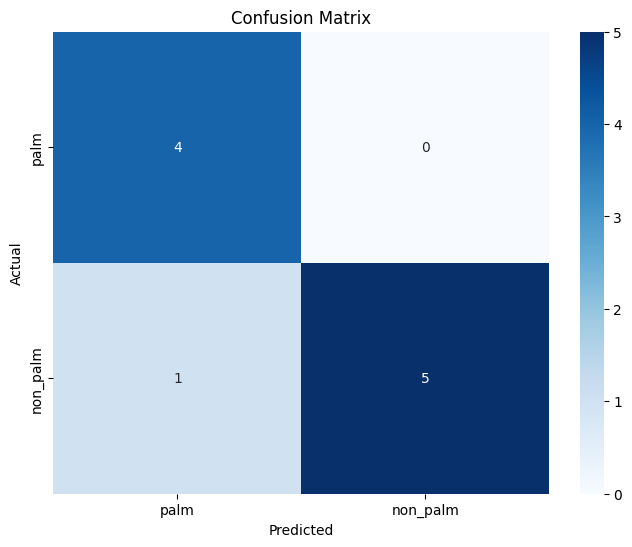

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
RF_model = RandomForestClassifier(n_estimators=100, random_state=319)
RF_model.fit(train_embeddings, train_labels)
pred_RF_resnet = RF_model.predict(test_embeddings)

# Compute accuracy
accuracy = accuracy_score(test_labels, pred_RF_resnet)
print(f'Accuracy: {accuracy:.2f}')

class_report = classification_report(test_labels, pred_RF_resnet, target_names=class_names)
print('Classification Report:\n', class_report)

conf_matrix = confusion_matrix(test_labels, pred_RF_resnet)
print('Confusion Matrix:\n', conf_matrix)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
def pure_image_model(img_path):
    img = load_and_preprocess_image(img_path)
    images = tf.concat(img, axis=0)
    img_embedding = model_resnet.predict(images)
    label = RF_model.predict(img_embedding)
    #if label = 1, it means it is not a palm tree, and vice verse
    return label

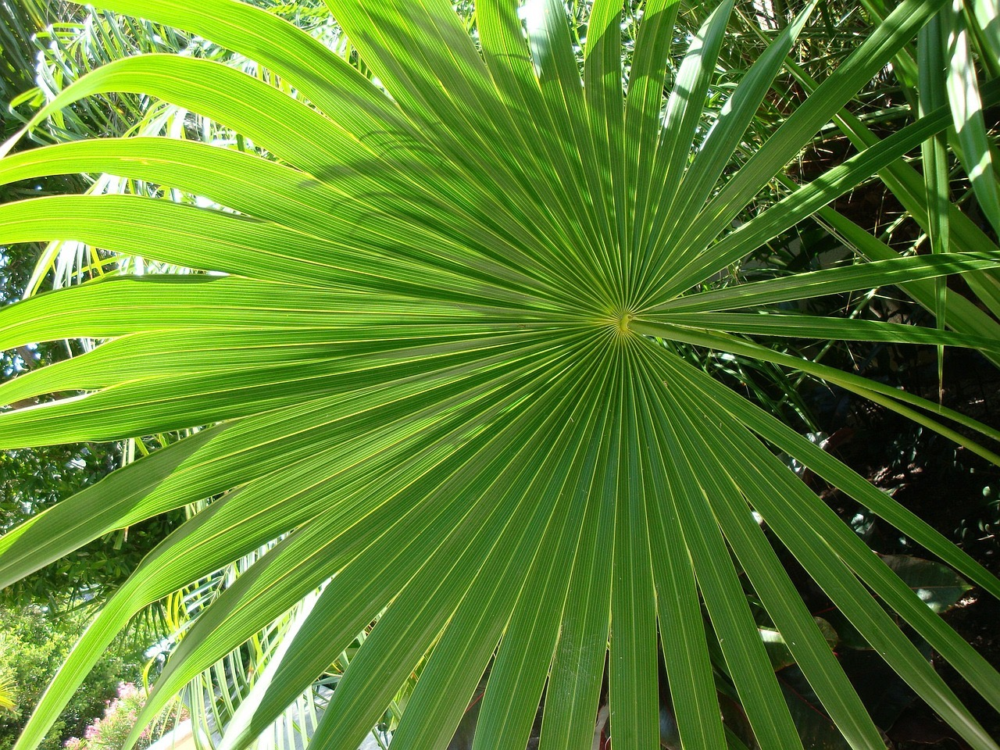

1/1 [==============================] - 0s 27ms/step
Palm Tree


In [ ]:
img_path = '/content/drive/My Drive/test_img/test.jpg'
img = Image.open(img_path)
display(img)
label = pure_image_model(img_path)
if label == 1:
  return 'not palm'
else:
  return 'palm'

In [ ]:
folder_path = 'tree_images'

filenames = sorted(os.listdir(folder_path), key=lambda x: int(x.split('_')[1].split('.')[0]))

predicted_class = []
for filename in os.listdir(folder_path):
    if filename.endswith('.tif'):
        image_path = os.path.join(folder_path, filename)
        result = pure_image_model(image_path)  # Call the model prediction function
        predicted_class.append(result)  # Append the result to the list

1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.10/dist-packages/rasterio/plot.py:109: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


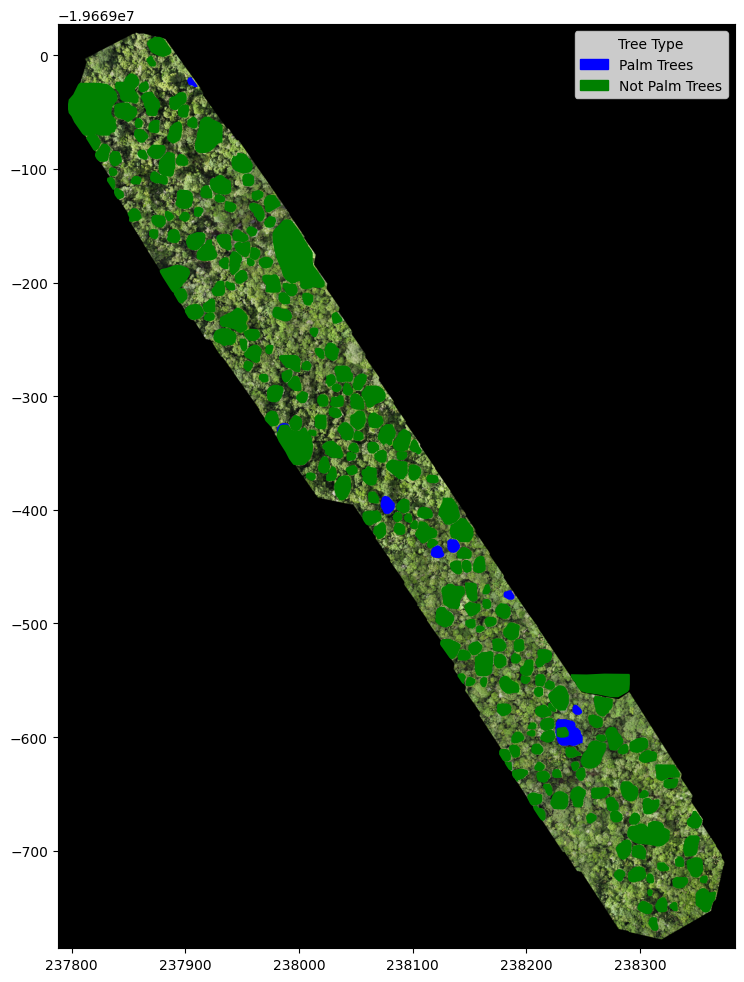

In [ ]:
raster_path = "rgb.tif"
sat_image = rasterio.open(raster_path)

tree_crowns = tree_crowns.to_crs(sat_image.crs)

colors = {0: 'blue', 1: 'green'}

fig, ax = plt.subplots(figsize=(12, 12))

show(sat_image, ax=ax)

for value, group in tree_crowns.groupby('predicted_class'):
    color = colors.get(value, 'red')
    group.plot(ax=ax, color=color, label=f'{value} {"Not Palm Trees" if value == 1 else "Palm Trees"}')

handles = [mpatches.Patch(color=color, label=f'{"Not Palm Trees" if idx == 1 else "Palm Trees"}') for idx, color in colors.items()]
ax.legend(handles=handles, title='Tree Type')
plt.show()

Image+Text

Adapting the sophisticated machine learning algorithm from the content classification model, we've developed a specialized system for binary classification of palm trees within satellite imagery. This system integrates Support Vector Machine (SVM) and Random Forest (RF) classifiers to effectively analyze visual features extracted from high-resolution close-up images. By employing a logistic regression-based fusion of predictions from the SVM and RF outputs, our model calculates a final probability score indicating the likelihood of an image (generated by predicted polygons from the first objective) containing a palm tree. The score is then compared against a predefined threshold to determine the presence of palm trees, facilitating precise ecological monitoring and resource management in tropical regions.

In [ ]:
image_text_files = {}

for folder in subfolders:
    folder_path = os.path.join(base_path, folder)
    files = os.listdir(folder_path)
    for f in files:
        base_name = f.split('.')[0]
        if base_name+'.JPG' in files and base_name+'.txt' in files:
            if str(folder) not in image_text_files.keys():
                image_text_files[str(folder)]=[base_name]
            else:
                image_text_files[str(folder)].append(base_name)
for folder in subfolders:
    image_text_files[str(folder)] = list(set(image_text_files[str(folder)]))

In [ ]:
images_2 = []
labels_2 = []
text_2 = []

for folder in subfolders:
    folder_path = os.path.join(base_path, folder)
    files = image_text_files[folder]
    for f in files:
        img_path = str(os.path.join(folder_path, f))+'.JPG'
        images_2.append(load_and_preprocess_image(img_path))
        txt_path = str(os.path.join(folder_path, f))+'.txt'
        with open(txt_path, 'r') as file:
            text = file.read()
            text_2.append(str(text))
        labels_2.append(subfolders.index(folder))

In [ ]:
images_2 = tf.concat(images_2, axis=0)
labels_2_tf = tf.convert_to_tensor(labels_2, dtype=tf.int64)

model_resnet = ResNet50(
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

img_embeddings = model_resnet.predict(images_2)

2/2 [==============================] - 2s 1s/step


In [ ]:
RF_model = RandomForestClassifier(n_estimators=100, random_state=319)
RF_model.fit(img_embeddings, labels_2_tf)
prob_RF_resnet = RF_model.predict_proba(img_embeddings)
prob_RF_resnet.shape
nltk.download('punkt')

tokenized_texts = [word_tokenize(text) for text in text_2]
word2vec = Word2Vec(tokenized_texts, vector_size=100, window=5, min_count=1, workers=4)

def vectorize_text(text):
    tokens = word_tokenize(text)
    vec = np.mean([word2vec.wv[token] for token in tokens if token in word2vec.wv], axis=0)
    return vec

text_vectors = np.array([vectorize_text(text) for text in text_2])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels_2)

scaler = StandardScaler()
scaler.fit(text_vectors)
text_vectors = scaler.transform(text_vectors)

svm_classifier = SVC(probability=True)
svm_classifier.fit(text_vectors, encoded_labels)

pred_SVM_text = svm_classifier.predict_proba(text_vectors)

In [ ]:
import numpy as np
from sklearn.linear_model import LogisticRegression

text_prob = pred_SVM_text[:, 0]
visual_prob = prob_RF_resnet[:, 0]

X = np.column_stack((text_prob, visual_prob))

y = labels_2

log_reg = LogisticRegression()
log_reg.fit(X, y)

weights = log_reg.coef_[0]

text_ratio = weights[0]/(weights[0]+weights[1])
visual_ratio = weights[1]/(weights[0]+weights[1])
text_ratio

0.4352652660924625

In [ ]:
def image_text_model(img_path, txt_path):
    img = load_and_preprocess_image(img_path)
    images = tf.concat(img, axis=0)
    img_embedding = model_resnet.predict(images)
    img_prob = RF_model.predict_proba(img_embedding)
    with open(txt_path, 'r') as file:
        text = str(file.read())
    text_vec = vectorize_text(text).reshape(1, -1)
    text_vec = scaler.transform(text_vec)
    text_prob = svm_classifier.predict_proba(text_vec)
    prob = visual_ratio*img_prob[:,0]+text_ratio*text_prob[:,0]
    if prob < 0.5:
        return 'Not a Palm Tree'
    else:
        return 'palm'

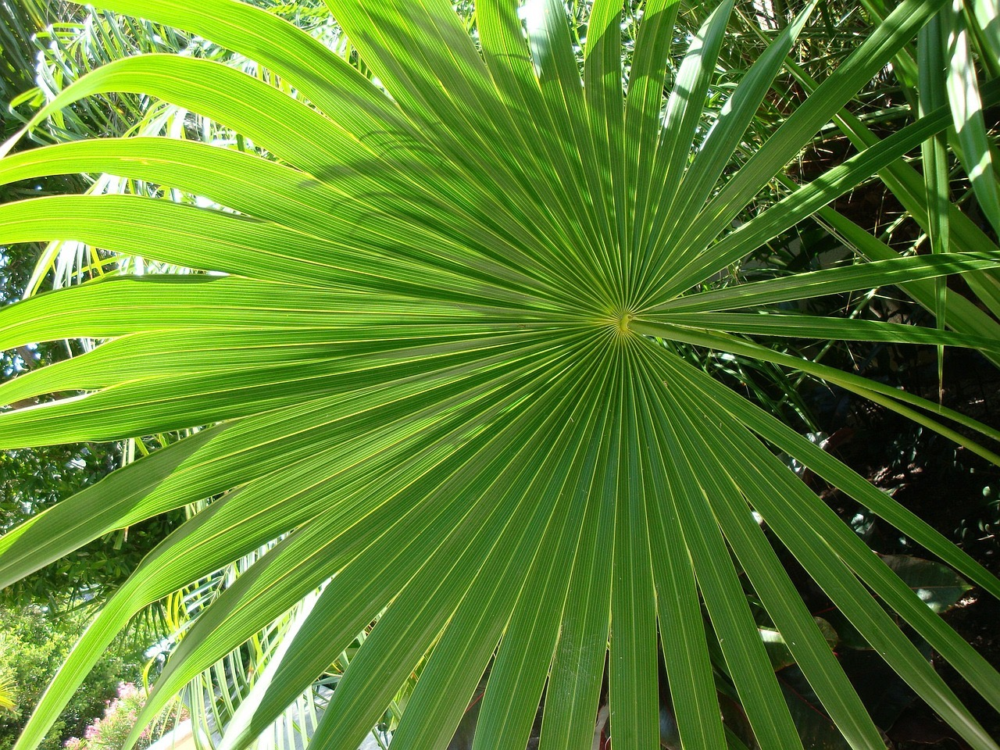

1/1 [==============================] - 0s 31ms/step
/content/drive/My Drive/test_img/test.txt


In [ ]:
img_path = '/content/drive/My Drive/test_img/test.jpg'
txt_path = '/content/drive/My Drive/test_img/test.txt'
img = Image.open(img_path)
display(img)
image_text_model(img_path, txt_path)
print(txt_path)

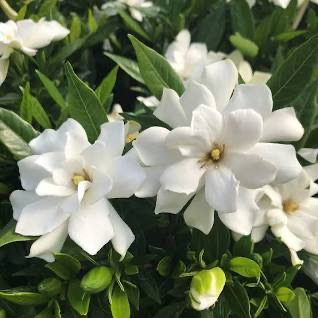

1/1 [==============================] - 0s 24ms/step


'Not a Palm Tree'

In [ ]:
img_path_2 = '/content/drive/My Drive/test_img/test.jpg'
txt_path_2 = '/content/drive/My Drive/test_img/test.txt'
img_2 = Image.open(img_path_2)
display(img_2)
image_text_model(img_path_2, txt_path_2)
print(txt_path_2)

##**Josh and Andrew's work**

We also want to see how the model applies to Josh and Andrew's work with their determined optimal tiles combinations 'crowns.gpkg' file with about 800mb 'odm_orthophoto.tif' for rgb file.

--2024-06-02 15:49:51--  https://storage.googleapis.com/imagery-geotiffs/andrew%40gainforest.net/manaus/odm_orthophoto.tif
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.174.207, 108.177.125.207, 74.125.23.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.174.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 842895324 (804M) [image/tiff]
Saving to: ‘odm_orthophoto.tif’

odm_orthophoto.tif  100%[===================>] 803.85M  13.3MB/s    in 63s     

2024-06-02 15:50:56 (12.8 MB/s) - ‘odm_orthophoto.tif’ saved [842895324/842895324]



Downloading...
From (original): https://drive.google.com/uc?id=1Mq_SLNwiQZ75mDvC-Qz8mXwWRLVUa4K5
From (redirected): https://drive.google.com/uc?id=1Mq_SLNwiQZ75mDvC-Qz8mXwWRLVUa4K5&confirm=t&uuid=bdb6fdf2-eb26-4ca9-bbaf-9af39a8e5614
To: /content/result.tif
100%|██████████| 378M/378M [00:07<00:00, 53.7MB/s]
/usr/local/lib/python3.10/dist-packages/rasterio/plot.py:109: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


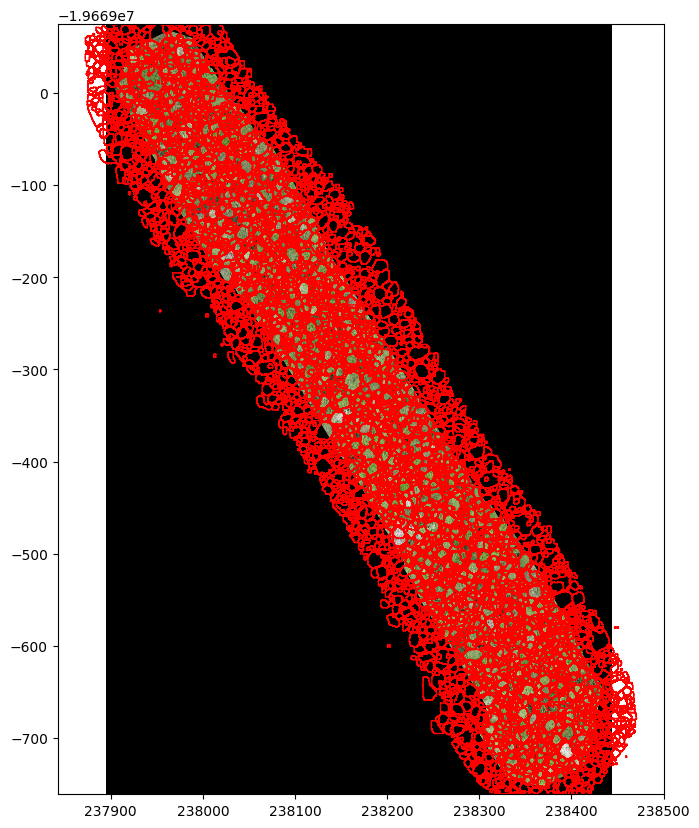

In [ ]:
!wget https://storage.googleapis.com/imagery-geotiffs/andrew%40gainforest.net/manaus/odm_orthophoto.tif
url = 'https://drive.google.com/uc?id=1Mq_SLNwiQZ75mDvC-Qz8mXwWRLVUa4K5'
output = 'result.tif'
gdown.download(url, output, quiet=False)
raster_path = "result.tif"
sat_image = rasterio.open(raster_path)
polygons = gpd.read_file('crowns.gpkg')
tree_crowns = polygons.to_crs(sat_image.crs)
fig, ax = plt.subplots(figsize=(10, 10))
show(sat_image, ax=ax)
# Overlay the tree crowns
tree_crowns.plot(ax=ax, facecolor='none', edgecolor='red')
plt.show()

As the rgb file does not have the same dimension with both DSM and DEM files, we rescaled the two files.

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np

with rasterio.open('odm_orthophoto.tif') as src_rgb:
    rgb_crs = src_rgb.crs
    rgb_transform = src_rgb.transform
    rgb_bounds = src_rgb.bounds

with rasterio.open('dem.tif') as src_dem:
    dem_data = src_dem.read(1)
    dem_crs = src_dem.crs
    dem_bounds = src_dem.bounds

if dem_crs != rgb_crs:
    transform, width, height = calculate_default_transform(
        src_dem.crs, rgb_crs, src_dem.width, src_dem.height, *dem_bounds)

    dem_reprojected = np.empty(shape=(height, width), dtype=rasterio.float32)
    reproject(
        source=dem_data,
        destination=dem_reprojected,
        src_transform=src_dem.transform,
        src_crs=src_dem.crs,
        dst_transform=transform,
        dst_crs=rgb_crs,
        resampling=Resampling.bilinear)
    dem_meta = src_dem.meta.copy()
    dem_meta.update({
        'crs': rgb_crs,
        'transform': transform,
        'width': width,
        'height': height,
        'driver': 'GTiff'
    })

    with rasterio.open('adjusted_dem.tif', 'w', **dem_meta) as dst:
        dst.write(dem_reprojected, 1)

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np

try:
    with rasterio.open('odm_orthophoto.tif') as src_rgb:
        rgb_crs = src_rgb.crs
        rgb_bounds = src_rgb.bounds

    with rasterio.open('dem.tif') as src_dsm:
        dsm_data = src_dsm.read(1)
        nodata = src_dsm.nodata
        masked_data = np.ma.masked_equal(dsm_data, nodata)

        if src_dsm.crs != rgb_crs:
            transform, width, height = calculate_default_transform(
                src_dsm.crs, rgb_crs, src_dsm.width, src_dsm.height, *src_dsm.bounds)

            dsm_reprojected = np.empty(shape=(height, width), dtype=rasterio.float32)
            reproject(
                source=dsm_data,
                destination=dsm_reprojected,
                src_transform=src_dsm.transform,
                src_crs=src_dsm.crs,
                dst_transform=transform,
                dst_crs=rgb_crs,
                resampling=Resampling.bilinear,
                src_nodata=nodata,
                dst_nodata=nodata
            )

            dsm_meta = src_dsm.meta.copy()
            dsm_meta.update({
                'crs': rgb_crs,
                'transform': transform,
                'width': width,
                'height': height,
                'driver': 'GTiff'
            })

            with rasterio.open('adjusted_dsm.tif', 'w', **dsm_meta) as dst:
                dst.write(dsm_reprojected, 1)
                print("Reprojected DSM written to 'adjusted_dsm.tif'.")

except Exception as e:
    print("Error encountered:", e)

Reprojected DSM written to 'adjusted_dsm.tif'.


Generate a new attribute (whether a polygon includes single tree or multiple tree) to 'crowns.gpkg' based on objective 2

In [ ]:
bimodal_flags = []

with rasterio.open('adjusted_dsm.tif') as src_dsm, rasterio.open('adjusted_dem.tif') as src_dem:
    dsm = src_dsm.read(1)
    dem_resampled = src_dem.read(
        1,
        out_shape=(src_dsm.height, src_dsm.width),
        resampling=Resampling.bilinear
    )

    tree_heights = dsm - dem_resampled

    polygons = gpd.read_file('crowns.gpkg')
    if src_dsm.crs != polygons.crs:
        polygons = polygons.to_crs(src_dsm.crs)

    for idx, polygon in polygons.iterrows():
        polygon_geom = polygon.geometry
        out_image, out_transform = mask(src_dsm, [polygon_geom], crop=True)
        masked_heights = out_image[0]
        masked_heights = np.where(masked_heights == src_dsm.nodata, np.nan, masked_heights)
        data = masked_heights.flatten()
        data = data[~np.isnan(data)]

        if data.size > 0:
            density = gaussian_kde(data)
            x = np.linspace(min(data), max(data), 1000)
            y = density(x)

            max_density = np.max(y)
            threshold_factor = 0.5
            dynamic_threshold = max_density * threshold_factor

            peaks = np.diff(np.sign(np.diff(y))).nonzero()[0] + 1
            filtered_peaks = []
            for peak in peaks:
                if y[peak] >= dynamic_threshold and (not filtered_peaks or x[peak] - x[filtered_peaks[-1]] >= 5):
                    filtered_peaks.append(peak)

            if len(filtered_peaks) > 1:
                bimodal_flags.append(1)  # Bimodal
            else:
                bimodal_flags.append(0)  # Not bimodal
        else:
          bimodal_flags.append(-1)

polygons['Multimodal'] = bimodal_flags
print(polygons[['Multimodal']])

      Multimodal
0              0
1              0
2              0
3             -1
4              0
...          ...
6864           1
6865           0
6866           0
6867          -1
6868           0

[6869 rows x 1 columns]


In [ ]:
polygons
polygons.to_file("modal_added.gpkg")

**Inference to gpkg file**

We calculated the percentage of single tree crowns among all the polygons. The result shows 98.95% of the polygons circled as individual tree which indicates the model from Josh and Andrew is effective.

In [ ]:
uni_modal = bimodal_flags.count(0)
uni_ptg = uni_modal/len(bimodal_flags)
uni_ptg

0.9895181249090115

##**Challenges and Future Work**

High-quality, labeled datasets are crucial for training accurate machine learning models. However, acquiring such datasets for remote and expansive areas like the Amazonian forest is costly and time-consuming. Additionally, inconsistencies in data quality, such as varying resolutions of satellite images or inaccuracies in existing tree databases, can hinder the model's performance. Moreover, processing large areas covered by high-resolution satellite images demands substantial computational resources. Ensuring the scalability of the model while maintaining high accuracy and efficiency lead to the future work, especially when deploying the model in real-time applications. Moreover, collaborative efforts could aid in obtaining high-quality, labeled datasets and integrating the model's outputs into ecological decision-making processes.

##**Appendix**

###**RGB metrics for objective 2**

It turns out the RGB metrics is not a valid way to verify it, as the RGB shows significantly small correlation with any individuals

In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import pandas as pd

with rasterio.open('adjusted_dsm.tif') as src_dsm, \
     rasterio.open('adjusted_dem.tif') as src_dem, \
     rasterio.open('odm_orthophoto.tif') as src_rgb:

    polygons = gpd.read_file('crowns_out.gpkg')
    if src_dsm.crs != polygons.crs:
        polygons = polygons.to_crs(src_dsm.crs)

    rgb_values = []

    for idx, polygon in polygons.iterrows():
        out_image_dsm, out_transform_dsm = mask(src_dsm, [polygon.geometry], crop=True)
        out_image_rgb, out_transform_rgb = mask(src_rgb, [polygon.geometry], crop=True)

        masked_heights = out_image_dsm[0]
        masked_heights = np.where(masked_heights == src_dsm.nodata, np.nan, masked_heights)
        data = masked_heights.flatten()
        data = data[~np.isnan(data)]

        if out_image_rgb.shape[1] > 0 and out_image_rgb.shape[2] > 0:
            red_channel = out_image_rgb[0]
            green_channel = out_image_rgb[1]
            blue_channel = out_image_rgb[2]

            red_mean = np.mean(red_channel[red_channel > 0]) if np.any(red_channel > 0) else 0
            green_mean = np.mean(green_channel[green_channel > 0]) if np.any(green_channel > 0) else 0
            blue_mean = np.mean(blue_channel[blue_channel > 0]) if np.any(blue_channel > 0) else 0

            rgb_values.append({'Red': red_mean, 'Green': green_mean, 'Blue': blue_mean})
        else:
            rgb_values.append({'Red': 0, 'Green': 0, 'Blue': 0})

    rgb_df = pd.DataFrame(rgb_values)
    polygons = pd.concat([polygons, rgb_df], axis=1)

    print(polygons[['Red', 'Green', 'Blue']])

             Red       Green        Blue
0      84.044384  119.326677   53.115721
1      75.441143  100.590256   60.087208
2      72.064390  106.894812   43.669857
3     132.662522  161.473901  102.993088
4      81.689322  109.042661   61.367958
...          ...         ...         ...
6864    0.000000    0.000000    0.000000
6865  116.971165  136.890691   97.681873
6866  115.970081  132.502456   98.761241
6867    0.000000    0.000000    0.000000
6868   96.244192  122.663554   75.245219

[6869 rows x 3 columns]


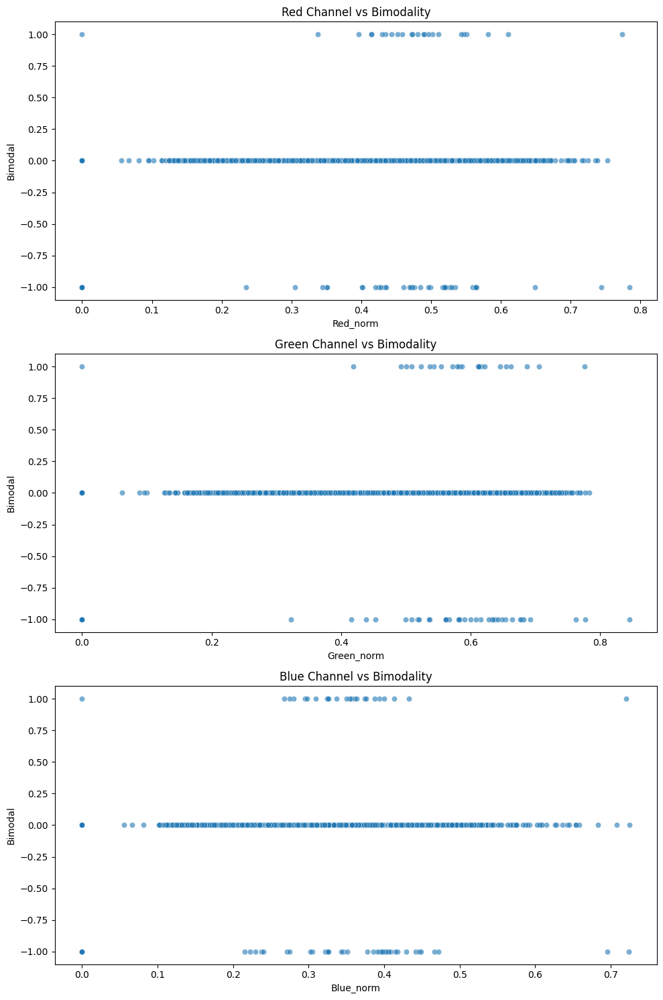

Correlation Coefficient (Red vs Bimodal): 0.0727648242355602
Correlation Coefficient (Green vs Bimodal): 0.0770725560474889
Correlation Coefficient (Blue vs Bimodal): 0.047429291279953635


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

polygons['Red_norm'] = polygons['Red'] / 255.0
polygons['Green_norm'] = polygons['Green'] / 255.0
polygons['Blue_norm'] = polygons['Blue'] / 255.0

fig, ax = plt.subplots(3, 1, figsize=(10, 15))

sns.scatterplot(data=polygons, x='Red_norm', y='Bimodal', ax=ax[0], alpha=0.6)
ax[0].set_title('Red Channel vs Bimodality')

sns.scatterplot(data=polygons, x='Green_norm', y='Bimodal', ax=ax[1], alpha=0.6)
ax[1].set_title('Green Channel vs Bimodality')

sns.scatterplot(data=polygons, x='Blue_norm', y='Bimodal', ax=ax[2], alpha=0.6)
ax[2].set_title('Blue Channel vs Bimodality')

plt.tight_layout()
plt.show()

print("Correlation Coefficient (Red vs Bimodal):", polygons['Red_norm'].corr(polygons['Bimodal']))
print("Correlation Coefficient (Green vs Bimodal):", polygons['Green_norm'].corr(polygons['Bimodal']))
print("Correlation Coefficient (Blue vs Bimodal):", polygons['Blue_norm'].corr(polygons['Bimodal']))

In [ ]:
polygons

,tree_id,tile_size,area,score,perimeter,roundness,geometry,Red,Green,Blue,Red_norm,Green_norm,Blue_norm,Bimodal
0,1,800,8.579915,0.955912,13.851969,0.561914,"POLYGON ((761542.122 9673771.125, 761542.122 9...",84.044384,119.326677,53.115721,0.329586,0.467948,0.208297,1
1,2,800,4.779555,0.938859,10.034193,0.596530,"POLYGON ((761540.091 9673757.801, 761540.091 9...",75.441143,100.590256,60.087208,0.295848,0.394472,0.235636,1
2,3,800,5.111338,0.925991,10.842806,0.546338,"POLYGON ((761543.029 9673759.629, 761543.029 9...",72.064390,106.894812,43.669857,0.282605,0.419195,0.171254,1
3,14,800,8.666730,0.904308,14.018102,0.554226,"POLYGON ((761540.662 9673726.777, 761540.662 9...",132.662522,161.473901,102.993088,0.520245,0.633231,0.403894,-1
4,17,800,7.912310,0.843539,12.894512,0.598003,"POLYGON ((761552.928 9673794.785, 761552.928 9...",81.689322,109.042661,61.367958,0.320350,0.427618,0.240659,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6864,20809,4000,253.072692,0.473062,86.083871,0.429152,"POLYGON ((761751.470 9673728.989, 761751.470 9...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
6865,20901,4000,272.994172,0.675374,81.467191,0.516890,"POLYGON ((761851.969 9673210.334, 761851.968 9...",116.971165,136.890691,97.681873,0.458710,0.536826,0.383066,0
6866,20902,4000,19.410222,0.409255,26.851011,0.338313,"POLYGON ((761854.249 9673208.367, 761854.249 9...",115.970081,132.502456,98.761241,0.454785,0.519617,0.387299,0
6867,21002,4000,7.906207,0.401417,12.490047,0.636869,"POLYGON ((761994.225 9673313.091, 761994.225 9...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1


###**Tree Height**

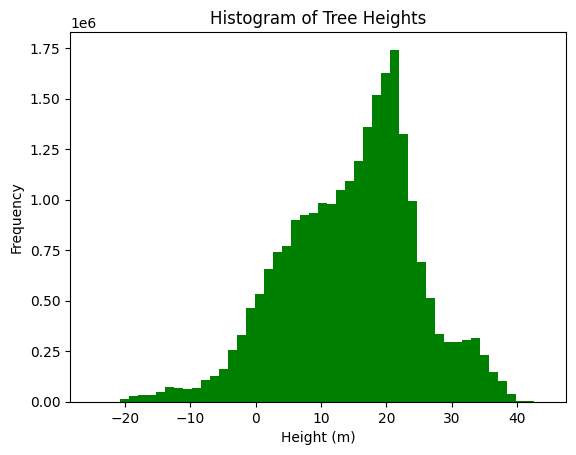

Tree Heights Statistics:
Min height: -24.942894
Max height: 44.01764
Mean height: 14.734503
Standard deviation: 10.083273


In [ ]:
#Visualization
import rasterio
from rasterio.enums import Resampling
import numpy as np

with rasterio.open('dsm.tif') as src_dsm:
    dsm = src_dsm.read(1)
    dsm_transform = src_dsm.transform
    dsm_crs = src_dsm.crs

with rasterio.open('dem.tif') as src_dem:
    dem_resampled = src_dem.read(
        1,
        out_shape=(src_dsm.height, src_dsm.width),
        resampling=Resampling.bilinear
    )

    transform = src_dem.transform * src_dem.transform.scale(
        (src_dem.width / src_dsm.width),
        (src_dem.height / src_dsm.height)
    )

tree_heights = dsm - dem_resampled
import numpy as np
import matplotlib.pyplot as plt

def mask_data(data, nodata_value):
    return np.ma.masked_equal(data, nodata_value)

dsm_masked = mask_data(dsm, -9999.0)
dem_masked = mask_data(dem_resampled, -9999.0)

tree_heights = dsm_masked - dem_masked

valid_tree_heights = tree_heights.compressed()

plt.figure()
plt.hist(valid_tree_heights, bins=50, color='green')
plt.title('Histogram of Tree Heights')
plt.xlabel('Height (m)')
plt.ylabel('Frequency')
plt.show()

print("Tree Heights Statistics:")
print("Min height:", valid_tree_heights.min())
print("Max height:", valid_tree_heights.max())
print("Mean height:", valid_tree_heights.mean())
print("Standard deviation:", valid_tree_heights.std())

In [ ]:
import numpy as np
import laspy

def classify_ground_points(lidar_points):
    ground_points = lidar_points.classification == 2
    return lidar_points[ground_points]

def calculate_tree_heights(lidar_points, ground_points):
    ground_level = np.min(ground_points.z)
    tree_heights = lidar_points.z - ground_level
    return tree_heights

def load_and_process_lidar_data(file_path):
    with laspy.open(file_path) as file:
        lidar_points = file.read()
    ground_points = classify_ground_points(lidar_points)
    tree_heights = calculate_tree_heights(lidar_points, ground_points)
    return tree_heights

lidar_file_path = 'cloud1.las'
tree_heights = load_and_process_lidar_data(lidar_file_path)
positive_tree_heights = tree_heights[tree_heights > 0]
average_tree_height = np.mean(positive_tree_heights)
max_tree_height = np.max(positive_tree_heights)
min_tree_height = np.min(positive_tree_heights)

print(f"Average Tree Height: {average_tree_height:.2f} meters")
print(f"Maximum Tree Height: {max_tree_height:.2f} meters")
print(f"Minimum Tree Height: {min_tree_height:.2f} meters")

Average Tree Height: 36.64 meters
Maximum Tree Height: 140.04 meters
Minimum Tree Height: 0.02 meters


In [ ]:
import laspy
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.transform import from_origin

def create_heatmap(lidar_points, width, height, bounds):
    """ Create a heatmap grid from LiDAR points """
    grid = np.zeros((height, width))
    x_min, y_min, x_max, y_max = bounds
    x_res = (x_max - x_min) / width
    y_res = (y_max - y_min) / height

    for x, y, z in zip(lidar_points.x, lidar_points.y, lidar_points.z):
        col = int((x - x_min) / x_res)
        row = int((y - y_min) / y_res)
        if 0 <= col < width and 0 <= row < height:
            grid[row, col] += z

    grid /= grid.max()
    return grid

file_path = 'cloud1.las'
dem_path = 'result_10cm_3.tif'

with laspy.open(file_path) as file:
  lidar_points = file.read()

bounds = (np.min(lidar_points.x), np.min(lidar_points.y),np.max(lidar_points.x), np.max(lidar_points.y))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
bounds = (np.min(lidar_points.x), np.min(lidar_points.y),
              np.max(lidar_points.x), np.max(lidar_points.y))
heatmap = create_heatmap(lidar_points, 1024, 1024, bounds)

In [ ]:
with rasterio.open('result_10cm_3.tif') as dem:
    dem_data = dem.read(1)
    bounds = dem.bounds

def rotate_array(data, angle):
    return np.rot90(data, k=angle)
rotated_heatmap = rotate_array(heatmap, 1)

plt.figure(figsize=(10, 10))
#plt.imshow(dem_data, cmap='gray', extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
plt.imshow(rotated_heatmap, cmap='hot', alpha=0.5, extent=[bounds.left, bounds.right, bounds.bottom, bounds.top])
plt.colorbar(label='Normalized Tree Height')
plt.title('Tree Height Density Heatmap')
plt.show()


In [ ]:
#3D version

from mpl_toolkits.mplot3d import Axes3D

fig, ax = plt.subplots(subplot_kw={'projection': '3d'})
X, Y = np.meshgrid(np.linspace(bounds.left, bounds.right, heatmap.shape[1]),
                   np.linspace(bounds.bottom, bounds.top, heatmap.shape[0]))
#ax.plot_surface(X, Y, dem_data, facecolors=plt.cm.gray(dem_data / dem_data.max()))
ax.plot_surface(X, Y, heatmap, facecolors=plt.cm.hot(heatmap / heatmap.max()), alpha=0.5)

ax.view_init(elev=20, azim=30)
plt.show()


In [ ]:
with laspy.open(file_path) as file:
        lidar_points = file.read()
lidar_points

<LasData(1.2, point fmt: <PointFormat(3, 0 bytes of extra dims)>, 161170585 points, 1 vlrs)>

In [ ]:
import laspy

def load_lidar_data(file_path):
    with laspy.open(file_path) as file:
        lidar_points = file.read()
    return lidar_points

def filter_vegetation_points_by_height(lidar_points, height_threshold=2.0):
    vegetation_mask = lidar_points.z > height_threshold
    vegetation_points = lidar_points[vegetation_mask]
    x = vegetation_points.x
    y = vegetation_points.y
    z = vegetation_points.z
    return np.rec.fromarrays([x, y, z], names='x, y, z')

def create_height_grid(vegetation_points, bounds, resolution):
    x_min, y_min, x_max, y_max = bounds
    cols = int((x_max - x_min) / resolution)
    rows = int((y_max - y_min) / resolution)
    height_grid = np.zeros((rows, cols))

    for point in vegetation_points:
        col = int((point.x - x_min) / resolution)
        row = int((point.y - y_min) / resolution)
        if 0 <= col < cols and 0 <= row < rows:
            height_grid[row, col] = max(height_grid[row, col], point.z)

    return height_grid
def calculate_canopy_cover(height_grid, height_threshold):
    canopy_cells = height_grid > height_threshold
    total_cells = height_grid.size
    canopy_cover_percentage = (np.sum(canopy_cells) / total_cells) * 100
    return canopy_cover_percentage

In [ ]:
def print_unique_classes(lidar_points):
    print("Unique classifications:", np.unique(lidar_points.classification))

print_unique_classes(lidar_points)

Unique classifications: [1 2]


Total Density: 161170580
Average Density: 11.823703399172278


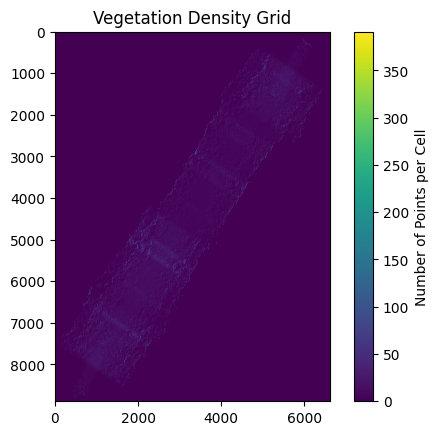

In [ ]:
import numpy as np

def create_density_grid(vegetation_points, bounds, resolution):
    x_min, y_min, x_max, y_max = bounds
    cols = int((x_max - x_min) / resolution)
    rows = int((y_max - y_min) / resolution)
    density_grid = np.zeros((rows, cols), dtype=int)
    col_indices = ((vegetation_points.x - x_min) / resolution).astype(int)
    row_indices = ((vegetation_points.y - y_min) / resolution).astype(int)

    valid = (col_indices >= 0) & (col_indices < cols) & (row_indices >= 0) & (row_indices < rows)
    col_indices = col_indices[valid]
    row_indices = row_indices[valid]

    # Use np.add.at to accumulate point counts in grid cells
    np.add.at(density_grid, (row_indices, col_indices), 1)

    return density_grid

def calculate_density_metrics(density_grid):
    total_density = np.sum(density_grid)
    vegetated_cells = np.count_nonzero(density_grid)
    average_density = total_density / vegetated_cells if vegetated_cells else 0
    return total_density, average_density
import matplotlib.pyplot as plt

def plot_density_grid(density_grid):
    plt.imshow(density_grid, cmap='viridis')
    plt.colorbar(label='Number of Points per Cell')
    plt.title('Vegetation Density Grid')
    plt.show()

lidar_points = load_lidar_data('cloud1.las')
vegetation_points = filter_vegetation_points_by_height(lidar_points, 2.0)

if len(vegetation_points) > 0:
    bounds = (min(vegetation_points.x), min(vegetation_points.y),
              max(vegetation_points.x), max(vegetation_points.y))
    resolution = 0.1
    density_grid = create_density_grid(vegetation_points, bounds, resolution)
    total_density, average_density = calculate_density_metrics(density_grid)
    print(f"Total Density: {total_density}")
    print(f"Average Density: {average_density}")
    plot_density_grid(density_grid)
else:
    print("No vegetation points found to process.")

lidar_points = load_lidar_data('cloud1.las')
vegetation_points = filter_vegetation_points_by_height(lidar_points, 2.0)

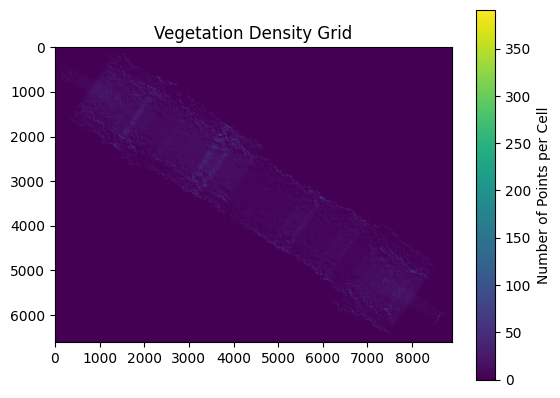

In [ ]:
def plot_density_grid(density_grid):
    rotated_grid = np.rot90(density_grid, k=-1)

    plt.imshow(rotated_grid, cmap='viridis')
    plt.colorbar(label='Number of Points per Cell')
    plt.title('Vegetation Density Grid')
    plt.show()
plot_density_grid(density_grid)

In [ ]:
vegetation_points
print("Total LiDAR points:", len(lidar_points))
print("Vegetation points found:", len(vegetation_points))

Total LiDAR points: 161170585
Vegetation points found: 0


In [ ]:
import rasterio
from rasterio.enums import Resampling

def resample_raster(file_path, scale_factor=2):
    """ Resample a raster to a new resolution based on a scale factor. """
    with rasterio.open(file_path) as dataset:
        new_width = dataset.width // scale_factor
        new_height = dataset.height // scale_factor

        data = dataset.read(
            out_shape=(
                dataset.count,
                new_height,
                new_width
            ),
            resampling=Resampling.bilinear
        )

        new_transform = dataset.transform * dataset.transform.scale(
            (dataset.width / data.shape[-1]),
            (dataset.height / data.shape[-2])
        )

        new_file_path = "resampled_" + file_path
        with rasterio.open(
            new_file_path, 'w',
            driver='GTiff',
            height=new_height,
            width=new_width,
            count=dataset.count,
            dtype=data.dtype,
            crs=dataset.crs,
            transform=new_transform,
        ) as new_dataset:
            new_dataset.write(data)

    return new_file_path

dem_file_path = 'dem.tif'
new_dem_path = resample_raster(dem_file_path,8)
print(f"Resampled DEM saved to: {new_dem_path}")

In [ ]:
import rasterio

def check_raster_dimensions(file_path):
    with rasterio.open(file_path) as src:
        width = src.width
        height = src.height
        transform = src.transform
        pixelSizeX = src.transform[0]
        pixelSizeY = -src.transform[4]

        print("Width:", width, "pixels")
        print("Height:", height, "pixels")
        print("Pixel Size (X):", pixelSizeX, "units")
        print("Pixel Size (Y):", pixelSizeY, "units")
        print("Transform:", transform)

file_path = 'resampled_dem.tif'
check_raster_dimensions(file_path)

In [ ]:
import laspy
import rasterio
import numpy as np
from sklearn.cluster import DBSCAN

def load_lidar_data(lidar_path):
    with laspy.open(lidar_path) as file:
        return file.read()

def load_dem(dem_path):
    return rasterio.open(dem_path)

def get_ground_elevation(dem, x, y):
    """ Sample the raster at given coordinates """
    row, col = dem.index(x, y)
    return dem.read(1)[row, col]

def process_lidar_and_dem(lidar_points, dem):
    x, y, z = lidar_points.x, lidar_points.y, lidar_points.z
    ground_elevations = np.array([get_ground_elevation(dem, x_val, y_val) for x_val, y_val in zip(x, y)])
    tree_heights = z - ground_elevations

    coords = np.vstack((x, y, tree_heights)).transpose()
    clustering = DBSCAN(eps=5, min_samples=10).fit(coords)
    labels = clustering.labels_

    return tree_heights, labels

lidar_file_path = 'cloud1.las'
dem_file_path = 'resampled_dem.tif'

lidar_points = load_lidar_data(lidar_file_path)
dem = load_dem(dem_file_path)

tree_heights, labels = process_lidar_and_dem(lidar_points, dem)
print("Processed tree heights and canopy delineation.")

###**Analyze Structural Features**
####**Implication for Diversity and Health**:

**Biodiversity**: The variation in circularity may indicate a diversity of tree species, as different species and even individual trees within the same species can exhibit different crown shapes due to genetic and environmental factors.

**Health and Age**: Younger or healthier trees might have more symmetrical and circular crowns, while older or stressed trees might show more irregular shapes.

**Result**

The majority of tree crowns have circularity values between 0.85 and 0.95, suggesting that most tree crowns are relatively round but not perfectly circular. This could imply a common structural growth pattern or species type where tree crowns tend to be robust but slightly irregular.

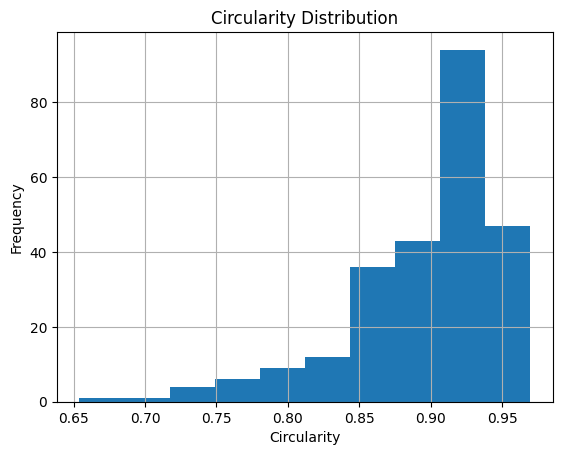

,Confidence_score,geometry,area,perimeter,circularity,aspect_ratio
0,0.8098912835121155,"POLYGON ((-6750985.064 -326350.026, -6750986.4...",298.877930,63.708321,0.925361,1.237604
1,0.7489389777183533,"POLYGON ((-6750952.408 -326380.278, -6750955.8...",134.246204,44.122125,0.866561,1.374060
2,0.7164683938026428,"POLYGON ((-6750929.167 -326386.890, -6750934.1...",116.263755,39.240420,0.948827,1.155525
3,0.5557103753089905,"POLYGON ((-6750914.141 -326379.878, -6750916.9...",312.525324,67.271406,0.867829,1.377224
4,0.4116471409797668,"POLYGON ((-6750966.833 -326343.615, -6750973.2...",125.054283,41.188452,0.926312,1.136527
...,...,...,...,...,...,...
248,0.3117633759975433,"POLYGON ((-6750604.202 -326779.572, -6750606.4...",109.721034,39.929681,0.864785,1.047904
249,0.8533645868301392,"POLYGON ((-6751044.568 -326270.087, -6751047.5...",217.314681,54.101337,0.933003,1.251468
250,0.593722403049469,"POLYGON ((-6751066.406 -326241.437, -6751068.8...",123.448707,40.698528,0.936567,1.021958
251,0.5803752541542053,"POLYGON ((-6751071.615 -326288.118, -6751077.4...",245.131281,62.922736,0.778025,1.386634


In [ ]:
crowns = gpd.read_file("crowns_out.gpkg")

crowns['area'] = crowns.area
crowns['perimeter'] = crowns.length
crowns['circularity'] = 4 * np.pi * (crowns['area'] / crowns['perimeter']**2)

def get_aspect_ratio(polygon):
    min_rect = polygon.minimum_rotated_rectangle
    coords = list(min_rect.exterior.coords)
    edge_length = [np.sqrt((coords[i][0] - coords[i-1][0])**2 + (coords[i][1] - coords[i-1][1])**2) for i in range(1, len(coords))]
    length, width = max(edge_length), min(edge_length)
    return length / width

crowns['aspect_ratio'] = crowns['geometry'].apply(get_aspect_ratio)

crowns['circularity'].hist()
plt.title('Circularity Distribution')
plt.xlabel('Circularity')
plt.ylabel('Frequency')
plt.show()

In [ ]:
def rasterize_polygon(polygon, cell_size=0.1):
    if polygon.is_empty:
        return np.zeros((1, 1))
    bounds = polygon.bounds
    width = int((bounds[2] - bounds[0]) / cell_size)
    height = int((bounds[3] - bounds[1]) / cell_size)
    transform = rasterio.transform.from_bounds(*bounds, width, height)
    return rasterize([(mapping(polygon), 1)], out_shape=(height, width), transform=transform, fill=0, dtype='uint8')

def fractal_dimension(Z, threshold=0.9):
    assert len(Z.shape) == 2, "Input must be a 2D array"
    def boxcount(Z, k):
        k = int(k)
        S = np.add.reduceat(
            np.add.reduceat(Z, np.arange(0, Z.shape[0], k), axis=0),
            np.arange(0, Z.shape[1], k), axis=1)
        return len(np.where(S > 0)[0])

    Z = (Z >= threshold)
    p = min(Z.shape)
    n = 2**np.floor(np.log(p)/np.log(2))
    n = int(n)
    sizes = 2**np.arange(int(np.log(n)/np.log(2)), 1, -1)
    counts = [boxcount(Z, size) for size in sizes]
    coeffs = np.polyfit(np.log(sizes), np.log(counts), 1)
    return -coeffs[0]

def calculate_eccentricity(polygon):
    if polygon.is_empty:
        return 0
    x, y = polygon.exterior.coords.xy
    coords = np.column_stack((x, y))
    cov_matrix = np.cov(coords, rowvar=False)
    eigenvalues = np.linalg.eigvals(cov_matrix)
    a, b = np.sqrt(eigenvalues)
    if a < b:
        a, b = b, a
    return np.sqrt(1 - (b/a)**2)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


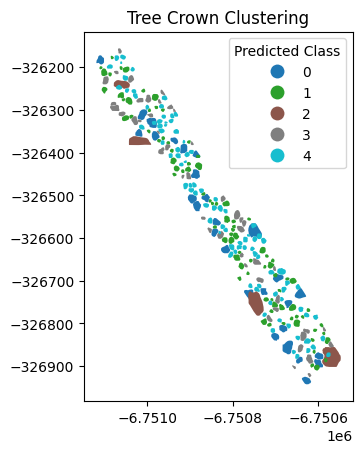

In [ ]:
crowns = gpd.read_file("crowns_out.gpkg")

crowns['area'] = crowns.area
crowns['perimeter'] = crowns.length
crowns['circularity'] = 4 * np.pi * (crowns['area'] / crowns['perimeter']**2)
crowns['aspect_ratio'] = crowns['geometry'].apply(lambda poly: max(poly.bounds[2] - poly.bounds[0], poly.bounds[3] - poly.bounds[1]) / min(poly.bounds[2] - poly.bounds[0], poly.bounds[3] - poly.bounds[1]))
crowns['fractal_dim'] = crowns['geometry'].apply(lambda poly: fractal_dimension(rasterize_polygon(poly)))
crowns['eccentricity'] = crowns['geometry'].apply(calculate_eccentricity)

features = crowns[['area', 'perimeter', 'circularity', 'aspect_ratio','fractal_dim','eccentricity']]

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

k = 5
kmeans = KMeans(n_clusters=k, random_state=0)
crowns['cluster'] = kmeans.fit_predict(features_scaled)

fig, ax = plt.subplots()
crowns.plot(column='cluster', ax=ax, legend=True, categorical=True, legend_kwds={'title': "Predicted Class"})
plt.title('Tree Crown Clustering')
plt.show()

/usr/local/lib/python3.10/dist-packages/rasterio/plot.py:109: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


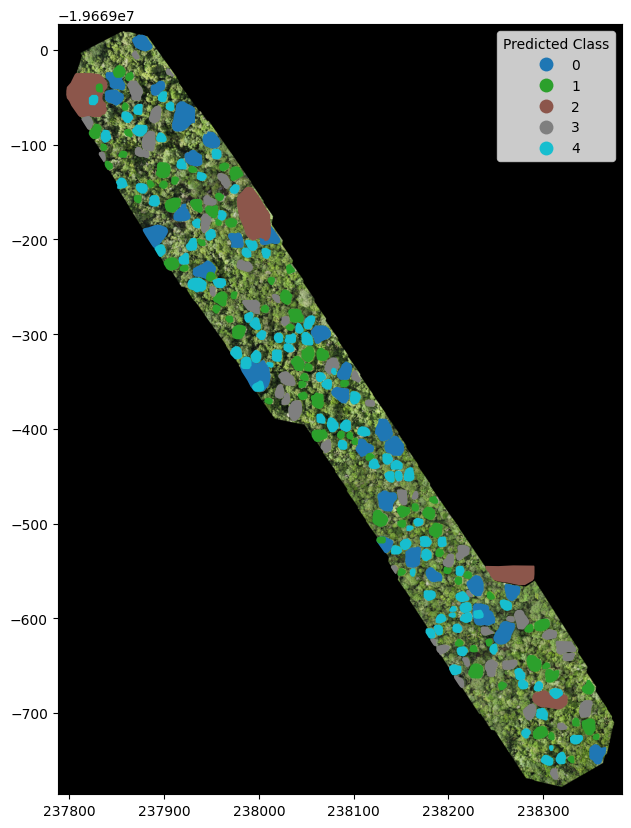

In [ ]:
raster_path = "rgb.tif"
sat_image = rasterio.open(raster_path)
tree_crowns = crowns
tree_crowns = crowns.to_crs(sat_image.crs)
fig, ax = plt.subplots(figsize=(10, 10))
show(sat_image, ax=ax)
tree_crowns.plot(column='cluster', ax=ax, legend=True, categorical=True, legend_kwds={'title': "Predicted Class"})
plt.show()